## **Resturant Data Analytics**

---

# **Probelm Statement :**
A restaurant consolidator is looking to revamp its B-to-C portal using intelligent automation tech. It is in search of different matrix to identify and recommend restaurants. To make sure an effective model can be achieved it is important to understand the behaviour of the data in hand.

# Data Exploration

In [25]:
#import libraries
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
!pip install ydata-profiling


In [10]:
#import dataset
df = pd.read_excel("/content/data.xlsx")

In [3]:
from ydata_profiling import ProfileReport

# Generate the profile report
profile = ProfileReport(df)

# Display the report (interactive HTML)
profile.to_notebook_iframe()


Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

# Task 1

---


Perform preliminary data inspection and report the findings as the structure of the data, missing values, duplicates cleaning variable names etc.

In [19]:
# Preliminary data inspection
structure = df.info()
missing_values = df.isnull().sum()
duplicates = df.duplicated().sum()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9551 entries, 0 to 9550
Data columns (total 19 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   restaurant_id         9551 non-null   int64  
 1   restaurant_name       9550 non-null   object 
 2   country_code          9551 non-null   int64  
 3   city                  9551 non-null   object 
 4   address               9551 non-null   object 
 5   locality              9551 non-null   object 
 6   locality_verbose      9551 non-null   object 
 7   longitude             9551 non-null   float64
 8   latitude              9551 non-null   float64
 9   cuisines              9542 non-null   object 
 10  average_cost_for_two  9551 non-null   int64  
 11  currency              9551 non-null   object 
 12  has_table_booking     9551 non-null   object 
 13  has_online_delivery   9551 non-null   object 
 14  price_range           9551 non-null   int64  
 15  aggregate_rating     

In [14]:
# Clean the variable names
df.columns = df.columns.str.lower().str.replace(' ', '_')

# Task 2

---


Based on the findings from the previous questions identify duplicates and remove them.

In [16]:
# Handle missing values
df_cleaned = df.dropna(subset=['restaurant_name'])

In [20]:
# Summary after cleaning
summary_after_cleaning = {
    'missing_values_after_cleaning': df_cleaned.isnull().sum(),
    'duplicates_after_cleaning': df_cleaned.duplicated().sum(),
    'unique_has_table_booking': df_cleaned['has_table_booking'].unique(),
    'unique_has_online_delivery': df_cleaned['has_online_delivery'].unique()
}

print(structure)
print("Missing values before cleaning:", missing_values)
print("Duplicates before cleaning:", duplicates)
print("Variable names after cleaning:", df.columns)
print("Summary after cleaning:", summary_after_cleaning)

None
Missing values before cleaning: restaurant_id           0
restaurant_name         1
country_code            0
city                    0
address                 0
locality                0
locality_verbose        0
longitude               0
latitude                0
cuisines                9
average_cost_for_two    0
currency                0
has_table_booking       0
has_online_delivery     0
price_range             0
aggregate_rating        0
rating_color            0
rating_text             0
votes                   0
dtype: int64
Duplicates before cleaning: 0
Variable names after cleaning: Index(['restaurant_id', 'restaurant_name', 'country_code', 'city', 'address',
       'locality', 'locality_verbose', 'longitude', 'latitude', 'cuisines',
       'average_cost_for_two', 'currency', 'has_table_booking',
       'has_online_delivery', 'price_range', 'aggregate_rating',
       'rating_color', 'rating_text', 'votes'],
      dtype='object')
Summary after cleaning: {'missing_values_a

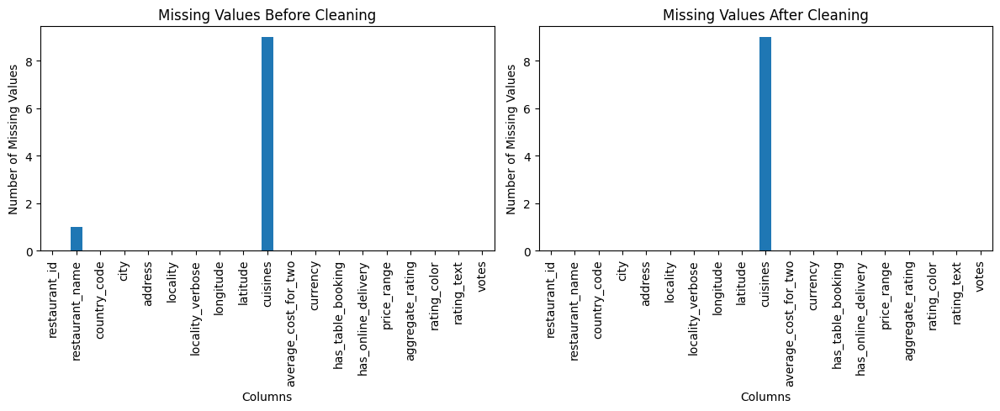

In [21]:
# Extract missing values before and after cleaning
missing_values_before = df.isnull().sum()
missing_values_after = summary_after_cleaning['missing_values_after_cleaning']

# Plot both in the same figure
fig, axes = plt.subplots(1, 2, figsize=(12, 5))

missing_values_before.plot(kind='bar', ax=axes[0])
axes[0].set_title('Missing Values Before Cleaning')
axes[0].set_xlabel('Columns')
axes[0].set_ylabel('Number of Missing Values')

missing_values_after.plot(kind='bar', ax=axes[1])
axes[1].set_title('Missing Values After Cleaning')
axes[1].set_xlabel('Columns')
axes[1].set_ylabel('Number of Missing Values')

plt.tight_layout()
plt.show()

# Task 3

---


Explore the geographical distribution of the restaurants, finding out the cities  with maximum / minimum number of restaurants.

In [22]:
import geopandas as gpd
import folium

# Load restaurant data from the CSV
df = pd.read_excel('data.xlsx')

# Create a GeoDataFrame with point geometry
gdf = gpd.GeoDataFrame(df, geometry=gpd.points_from_xy(df['Longitude'], df['Latitude']))

# Create a Folium map centered around the mean latitude and longitude
map_center = [gdf['Latitude'].mean(), gdf['Longitude'].mean()]
mymap = folium.Map(control_scale=True)

# Add markers for each restaurant location
for _, row in gdf.iterrows():
    folium.CircleMarker(
        location=[row['Latitude'], row['Longitude']],
        radius=3,
        color='blue',
        fill=True,
        fill_color='blue'
    ).add_to(mymap)

# Display the map
mymap





City with maximum number of restaurants: New Delhi (5473 restaurants)
City with minimum number of restaurants: Phillip Island (1 restaurant)


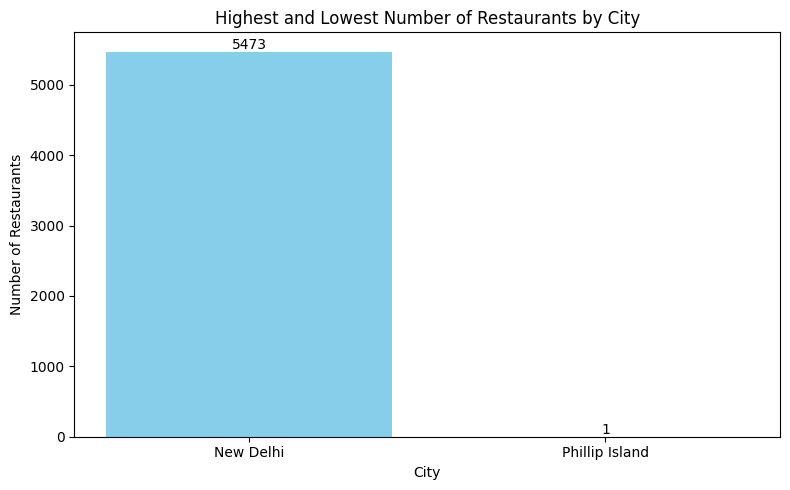

In [23]:
# Calculate the restaurant counts per city
city_counts = df_cleaned['city'].value_counts()

# Find cities with maximum and minimum number of restaurants
max_restaurants_city = city_counts.idxmax()
max_restaurants_count = city_counts.max()
min_restaurants_city = city_counts.idxmin()
min_restaurants_count = city_counts.min()

# Print the results
print(f"City with maximum number of restaurants: {max_restaurants_city} ({max_restaurants_count} restaurants)")
print(f"City with minimum number of restaurants: {min_restaurants_city} ({min_restaurants_count} restaurant)")

# Bar chart showing only the highest and lowest values
plt.figure(figsize=(8, 5))
plt.bar([max_restaurants_city, min_restaurants_city], [max_restaurants_count, min_restaurants_count], color=['skyblue', 'salmon'])
plt.title('Highest and Lowest Number of Restaurants by City')
plt.xlabel('City')
plt.ylabel('Number of Restaurants')

# Add data labels
plt.text(max_restaurants_city, max_restaurants_count, str(max_restaurants_count), ha='center', va='bottom')
plt.text(min_restaurants_city, min_restaurants_count, str(min_restaurants_count), ha='center', va='bottom')

plt.tight_layout()
plt.show()






# Task 4

---


Explore how ratings are distributed overall.

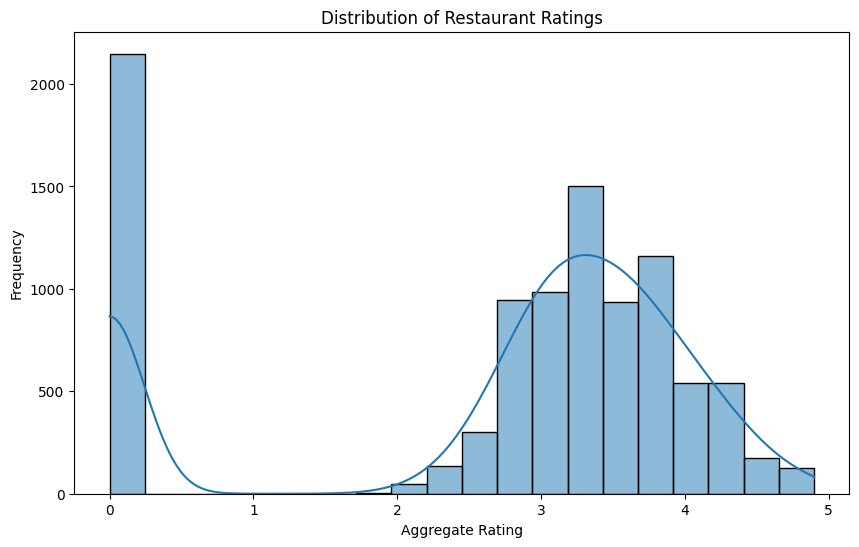

In [26]:
# Explore the distribution of ratings
plt.figure(figsize=(10, 6))
sns.histplot(df_cleaned['aggregate_rating'], bins=20, kde=True)
plt.title('Distribution of Restaurant Ratings')
plt.xlabel('Aggregate Rating')
plt.ylabel('Frequency')
plt.show()

# Task 5

---


Restaurant franchise is a thriving venture. So, it becomes very important to explore the franchise with most national presence.

In [27]:
# Determine the franchise with the most national presence
# Count the number of unique cities each restaurant is present in
franchise_presence = df_cleaned.groupby('restaurant_name')['city'].nunique().sort_values(ascending=False)

# Get the restaurant with the most national presence
top_franchise = franchise_presence.idxmax()
top_franchise_cities = franchise_presence.max()

print(f"Franchise with the most national presence: {top_franchise} (present in {top_franchise_cities} cities)")


Franchise with the most national presence: Barbeque Nation (present in 22 cities)


# Task 6
---


What is the ratio between restaurants that allow table booking vs that do not allow table booking?

In [28]:
# Calculate the ratio of restaurants that allow table booking vs those that do not
table_booking_counts = df_cleaned['has_table_booking'].value_counts()

# Calculate the ratio
if 'yes' in table_booking_counts and 'no' in table_booking_counts:
    ratio = table_booking_counts['yes'] / table_booking_counts['no']
else:
    ratio = None

print("Table Booking Counts:", table_booking_counts)



Table Booking Counts: has_table_booking
No     8392
Yes    1158
Name: count, dtype: int64


In [29]:
ratio = (1158 / (1158+8392)) * 100
print(f"The ratio between restaurants that allow table booking vs those that do not is {ratio:.2f}%")

The ratio between restaurants that allow table booking vs those that do not is 12.13%


# Task 7

---


What is the percentage of restaurants providing online delivery?

In [30]:
# Calculate the ratio of restaurants that allow table booking vs those that do not
online_delivery_count = df_cleaned['has_online_delivery'].value_counts()

# Calculate the ratio
if 'yes' in online_delivery_count and 'no' in online_delivery_count:
    ratio = online_delivery_count['yes'] / online_delivery_count['no']
else:
    ratio = None

print("Online_delivery_count:", online_delivery_count)


Online_delivery_count: has_online_delivery
No     7099
Yes    2451
Name: count, dtype: int64


In [31]:
ratio = (2451 / (2451+7099)) * 100
print(f"the percentage of restaurants providing online delivery is {ratio:.2f}%")

the percentage of restaurants providing online delivery is 25.66%


# Task 8

---


Is there a difference in no. of votes for the restaurants that deliver and the restaurant that don’t?

In [32]:
# Filter the DataFrame based on the 'Has Online delivery' column
online_delivery_votes = df_cleaned[df_cleaned['has_online_delivery'] == 'Yes']['votes']
no_online_delivery_votes = df_cleaned[df_cleaned['has_online_delivery'] == 'No']['votes']

# Calculate the average number of votes for each group
average_votes_online_delivery = online_delivery_votes.mean()
average_votes_no_online_delivery = no_online_delivery_votes.mean()

# Print the results
print(f"Average number of votes for restaurants that provide online delivery: {average_votes_online_delivery:.2f}")
print(f"Average number of votes for restaurants that do not provide online delivery: {average_votes_no_online_delivery:.2f}")

# Check the difference in number of votes
votes_difference = average_votes_online_delivery - average_votes_no_online_delivery
print(f"Difference in number of votes: {votes_difference:.2f}")

Average number of votes for restaurants that provide online delivery: 211.31
Average number of votes for restaurants that do not provide online delivery: 138.04
Difference in number of votes: 73.26


#### Yes there a difference in no. of votes for the restaurants that deliver and the restaurant that don’t. Those who provide online delivery option are given more votes.

# Task 9

---


What are the top 10 cuisines served across cities?

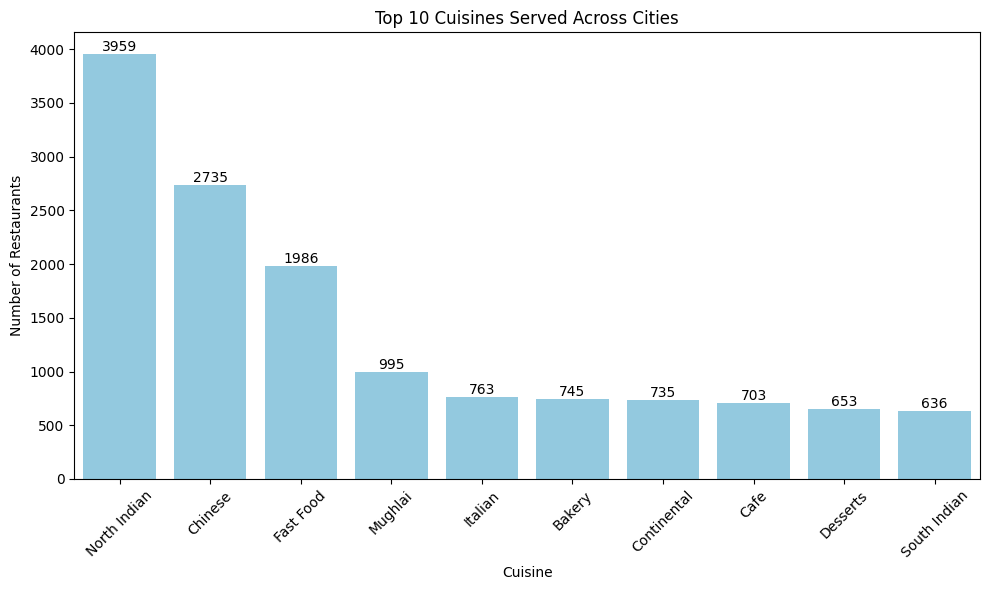

In [33]:
# Split the 'Cuisines' column into multiple cuisines
cuisines_series = df_cleaned['cuisines'].str.split(',').explode().str.strip()

# Count the occurrences of each cuisine
cuisine_counts = cuisines_series.value_counts()

# Get the top 10 cuisines
top_10_cuisines = cuisine_counts.head(10)

# Create a bar plot
plt.figure(figsize=(10, 6))
sns.barplot(x=top_10_cuisines.index, y=top_10_cuisines.values, color='skyblue')
plt.title('Top 10 Cuisines Served Across Cities')
plt.xlabel('Cuisine')
plt.ylabel('Number of Restaurants')
plt.xticks(rotation=45)

# Add data labels
for i, count in enumerate(top_10_cuisines.values):
    plt.text(i, count, str(count), ha='center', va='bottom')

plt.tight_layout()
plt.show()


# Task 10

---


What is the maximum and minimum no. of cuisines that a restaurant serves? Also, what is the relationship between No. of cuisines served and Ratings

In [34]:
# Create a copy of the DataFrame
df_cleaned = df.dropna(subset=['Cuisines']).copy()

# Calculate the number of cuisines served by each restaurant
df_cleaned['No_of_cuisines'] = df_cleaned['Cuisines'].str.split(',').apply(len)

# Group by 'Restaurant Name' to find the maximum and minimum number of cuisines served by any restaurant
cuisines_by_restaurant = df_cleaned.groupby('Restaurant Name')['No_of_cuisines'].agg(['max', 'min'])

max_cuisines = cuisines_by_restaurant['max'].max()
min_cuisines = cuisines_by_restaurant['min'].min()

print(f"The maximum number of cuisines served by a restaurant is: {max_cuisines}")
print(f"The minimum number of cuisines served by a restaurant is: {min_cuisines}")


The maximum number of cuisines served by a restaurant is: 8
The minimum number of cuisines served by a restaurant is: 1


In [36]:
# Analyze the relationship between the number of cuisines served and the ratings
relationship_df = df_cleaned[['No_of_cuisines', 'Aggregate rating']]

# Calculate the correlation between the number of cuisines served and the ratings
correlation = relationship_df.corr().iloc[0, 1]

print(f"The correlation between the number of cuisines served and the ratings is: {correlation:.2f}")

The correlation between the number of cuisines served and the ratings is: 0.25


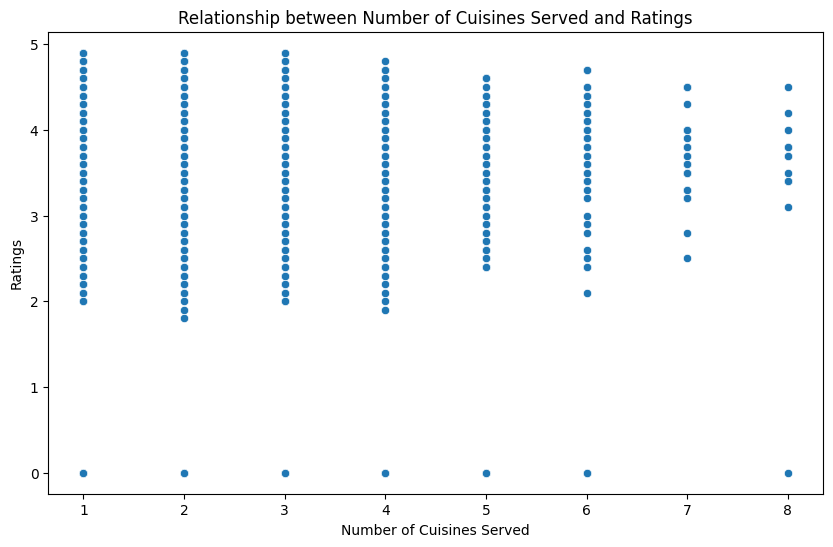

In [37]:
#Visualizing relationship between Number of Cuisines Served and Ratings
plt.figure(figsize=(10, 6))
sns.scatterplot(data=relationship_df, x='No_of_cuisines', y='Aggregate rating')
plt.title('Relationship between Number of Cuisines Served and Ratings')
plt.xlabel('Number of Cuisines Served')
plt.ylabel('Ratings')
plt.show()

# Task 11
---


Discuss the cost vs the other variables.

In [44]:
# Group by 'Country Code' and display the average cost for two
avg_price_by_country = df_cleaned.groupby('Country Code')['Average Cost for two'].mean()
avg_rating_by_country = df_cleaned.groupby('Country Code')['Aggregate rating'].mean()
avg_votes_by_country = df_cleaned.groupby('Country Code')['Votes'].mean()

# Print the result
print(avg_price_by_country)
print(avg_rating_by_country)
print(avg_votes_by_country)


Country Code
1         623.370319
14         24.083333
30        134.666667
37         36.250000
94     281190.476190
148        69.750000
162      1606.818182
166       223.750000
184       155.750000
189       419.733333
191      2375.000000
208        84.852941
214       166.416667
215        47.812500
216        26.352941
Name: Average Cost for two, dtype: float64
Country Code
1      2.523324
14     3.658333
30     3.763333
37     3.575000
94     4.295238
148    4.262500
162    4.468182
166    4.060000
184    3.575000
189    4.210000
191    3.870000
208    4.300000
214    4.233333
215    4.087500
216    4.007294
Name: Aggregate rating, dtype: float64
Country Code
1      137.212552
14     111.416667
30      19.616667
37     103.000000
94     772.095238
148    243.025000
162    407.409091
166    163.800000
184     31.900000
189    315.166667
191    146.450000
208    431.470588
214    493.516667
215    205.487500
216    430.875294
Name: Votes, dtype: float64


In [45]:
# Read the country code data from "Country-Code.xlsx"
country_codes_df = pd.read_excel("Country-Code.xlsx")

# Merge with the average cost, rating, and votes by country code
merged_df = pd.merge(country_codes_df, avg_price_by_country, on="Country Code", how="inner")
merged_df = pd.merge(merged_df, avg_rating_by_country, on="Country Code", how="inner")
merged_df = pd.merge(merged_df, avg_votes_by_country, on="Country Code", how="inner")

# Display the updated DataFrame
print("\nMerged DataFrame:\n", merged_df)




Merged DataFrame:
     Country Code         Country                Currency  \
0              1           India      Indian Rupees(Rs.)   
1             14       Australia               Dollar($)   
2             30          Brazil      Brazilian Real(R$)   
3             37          Canada               Dollar($)   
4             94       Indonesia  Indonesian Rupiah(IDR)   
5            148     New Zealand           NewZealand($)   
6            162     Phillipines        Botswana Pula(P)   
7            166           Qatar         Qatari Rial(QR)   
8            184       Singapore               Dollar($)   
9            189    South Africa                 Rand(R)   
10           191       Sri Lanka   Sri Lankan Rupee(LKR)   
11           208          Turkey        Turkish Lira(TL)   
12           214             UAE      Emirati Diram(AED)   
13           215  United Kingdom              Pounds(å£)   
14           216   United States               Dollar($)   

    Average Cost fo

# Task 12

---


Explain the factors in the data that may have an effect on ratings e.g. No. of cuisines, cost, delivery option etc.

***No. Of Cusisines Vs Ratings:***

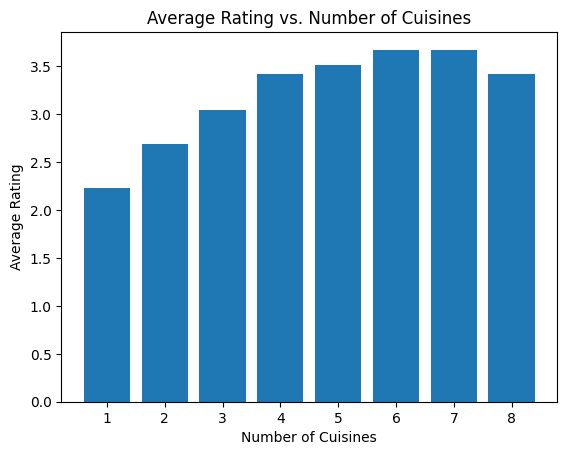

In [48]:
# Count the number of unique cuisines for each restaurant
df_cleaned['Num_Cuisines'] = df_cleaned['Cuisines'].apply(lambda x: len(x.split(',')))

# Group by the number of cuisines and calculate the average rating
avg_rating_by_cuisines = df_cleaned.groupby('Num_Cuisines')['Aggregate rating'].mean()

# Create a bar chart
plt.bar(avg_rating_by_cuisines.index, avg_rating_by_cuisines)
plt.xlabel('Number of Cuisines')
plt.ylabel('Average Rating')
plt.title('Average Rating vs. Number of Cuisines')
plt.show()


**Delivery Options vs. Ratings:**

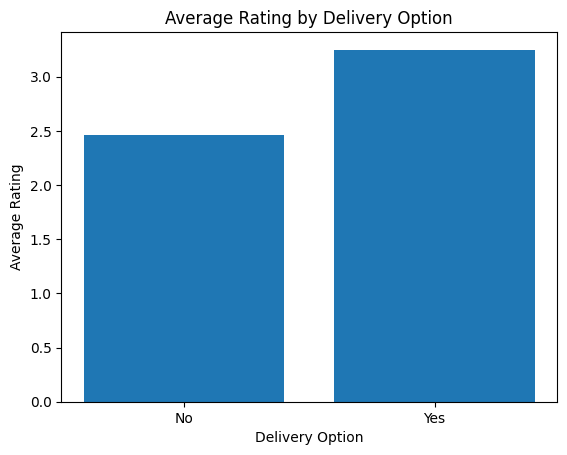

In [50]:
# Group by delivery option and calculate the average rating
avg_rating_by_delivery = df_cleaned.groupby('Has Online delivery')['Aggregate rating'].mean()

# Create a bar chart
plt.bar(avg_rating_by_delivery.index, avg_rating_by_delivery)
plt.xlabel('Delivery Option')
plt.ylabel('Average Rating')
plt.title('Average Rating by Delivery Option')
plt.show()
